In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# Cargar los datos de arrestos
df = pd.read_csv('BPD_Arrests.csv')


In [2]:
# Extraer latitud y longitud de la columna "Location 1"
df['Location 1'] = df['Location 1'].dropna()
df[['Latitude', 'Longitude']] = df['Location 1'].str.extract(r'\(([^,]+),\s*([^)]+)\)')

# Convertir a tipo float
df['Latitude'] = df['Latitude'].astype(float)
df['Longitude'] = df['Longitude'].astype(float)

# Asegúrate de que no queden valores nulos en las nuevas columnas
df = df.dropna(subset=['Latitude', 'Longitude'])


In [3]:
# Convertir a GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.Longitude, df.Latitude))

# Configurar el sistema de coordenadas (CRS)
gdf = gdf.set_crs('EPSG:4326')


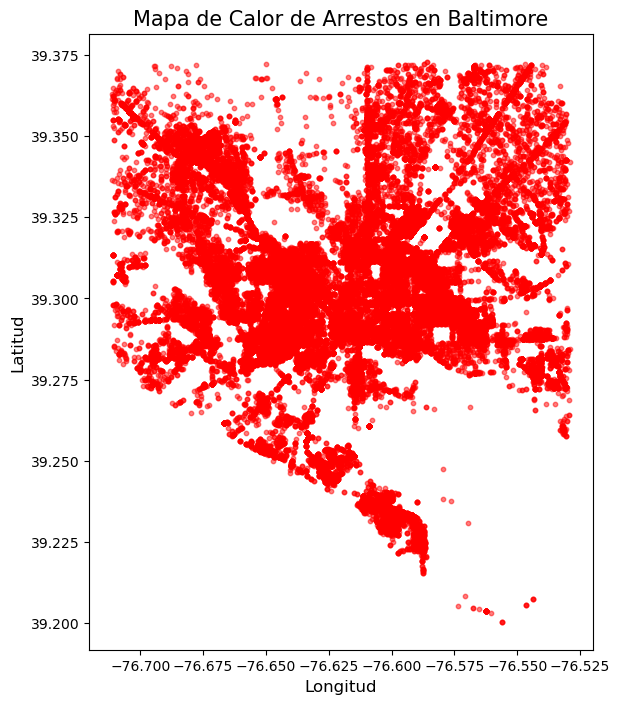

In [4]:
# Crear el mapa
fig, ax = plt.subplots(figsize=(12, 8))
gdf.plot(ax=ax, alpha=0.5, markersize=10, color='red')

# Configurar título y etiquetas
ax.set_title('Mapa de Calor de Arrestos en Baltimore', fontsize=15)
ax.set_xlabel('Longitud', fontsize=12)
ax.set_ylabel('Latitud', fontsize=12)

# Mostrar el mapa
plt.show()


In [15]:
# Crear un diccionario para mapear los delitos a las nuevas categorías
category_mapping = {
'102-QUESTIONAL DEATH': 'Violent Crimes',
'103-DEAD ON ARRIVAL': 'Violent Crimes',
'105-SUSPICIOUS BURNING': 'Violent Crimes',
'106-CUSTODY DISPUTE': 'Violent Crimes',
'107-DRUNKENNESS': 'Violent Crimes',
'108-LIQUOR LAW/OPEN CONTA': 'Alcohol Violations',
'108-LIQUOR LAW/OPEN CONTAIN': 'Alcohol Violations',
'108-LIQUOR LAW/OPEN CONTAINE': 'Alcohol Violations',
'109-LOITERING': 'Public Order Crimes',
'110-SUMMONS SERVED': 'Administrative',
'111-PROTECTIVE ORD': 'Domestic Crimes',
'111-PROTECTIVE ORDER': 'Domestic Crimes',
'112-TRAFFIC RELATE': 'Traffic Violations',
'112-TRAFFIC RELATED INCID': 'Traffic Violations',
'112-TRAFFIC RELATED INCIDEN': 'Traffic Violations',
'112-TRAFFIC RELATED INCIDENT': 'Traffic Violations',
'113-LITTERING': 'Environmental Violations',
'114-HINDERING': 'Obstruction of Justice',
'115-TRESPASSING': 'Property Crimes',
'115TRESPASSING': 'Property Crimes',
'116-PUBLIC URINATION / DEFE': 'Public Order Crimes',
'116-PUBLIC URINATION / DEFEC': 'Public Order Crimes',
'117-FTO': 'Administrative',
'117FTO': 'Administrative',
'118-BURGLARY - FOURTH DEG': 'Property Crimes',
'118-BURGLARY - FOURTH DEGRE': 'Property Crimes',
'118-BURGLARY - FOURTH DEGREE': 'Property Crimes',
'118BURGLARY - FOURTH DEGREE': 'Property Crimes',
'119-ISSUED IN ERROR': 'Administrative',
'119ISSUED IN ERROR': 'Administrative',
'1A-MURDER': 'Violent Crimes',
'1AMURDER': 'Violent Crimes',
'20A-FOLLOWUP': 'Investigations',
'20H-TRAFFIC CONTROL': 'Traffic Violations',
'23-UNAUTHORIZED US': 'Property Crimes',
'23-UNAUTHORIZED USE': 'Property Crimes',
'23UNAUTHORIZED USE': 'Property Crimes',
'24P-TOWED VEHICLE - PRIVATE': 'Traffic Violations',
'24TOWED VEHICLE': 'Traffic Violations',
'26-RECOVERED VEHICLE': 'Property Crimes',
'26RECOVERED VEHICLE': 'Property Crimes',
'29-DRIVING WHILE INTOXICATED': 'Traffic Violations',
'2A-RAPE (FORCE)': 'Sex Crimes',
'2ARAPE (FORCE)': 'Sex Crimes',
'2B-RAPE (ATTEMPT)': 'Sex Crimes',
'2C-CARNAL KNOWLEDGE': 'Sex Crimes',
'2D-STATUTORY RAPE': 'Sex Crimes',
'2F-PLACING HANDS': 'Sex Crimes',
'2FPLACING HANDS': 'Sex Crimes',
'2G-SODOMY/PERVERSON': 'Sex Crimes',
'2H-INDECENT EXP.': 'Sex Crimes',
'OTHER SEX OFFN.': 'Sex Crimes',
'33-PARKING COMPLAINT': 'Traffic Violations',
'39-FIRE': 'Fire Incidents',
'33AF-ROBB HWY-FIREARM': 'Robbery',
'3AFROBB HWY-FIREARM': 'Robbery',
'3AJF-ROBB CARJACK-FIREARM': 'Robbery',
'3AJFROBB CARJACK-FIREARM': 'Robbery',
'3AJK-ROBB CARJACK-KNIFE': 'Robbery',
'3AJO-ROBB CARJACK-OTHER WPN': 'Robbery',
'3AJOROBB CARJACK-OTHER WPN': 'Robbery',
'3AK-ROBB HWY-KNIFE': 'Robbery',
'3AKROBB HWY-KNIFE': 'Robbery',
'3AO-ROBB HWY-OTHER WPN': 'Robbery',
'3AOROBB HWY-OTHER WPN': 'Robbery',
'3B-ROBB HIGHWAY (UA)': 'Robbery',
'3BJ-ROBB CARJACK(UA)': 'Robbery',
'3BJROBB CARJACK(UA)': 'Robbery',
'3BROBB HIGHWAY (UA)': 'Robbery',
'3CF-ROBB COMM-FIREARM': 'Robbery',
'3CFROBB COMM-FIREARM': 'Robbery',
'3CK-ROBB COMM-KNIFE': 'Robbery',
'3CKROBB COMM-KNIFE': 'Robbery',
'3CO-ROBB COMM-OTHER WPN': 'Robbery',
'3COROBB COMM-OTHER WPN': 'Robbery',
'3D-ROBB COMM. (UA)': 'Robbery',
'3DROBB COMM. (UA)': 'Robbery',
'3EK-ROBB GAS STATION-KNIFE': 'Robbery',
'3EO-ROBB GAS STATION-OTHER W': 'Robbery',
'3F-ROBB GAS STA. (UA)': 'Robbery',
'3GF-ROBB CONV STORE-FIREARM': 'Robbery',
'3GO-ROBB CONV STORE-OTHER WP': 'Robbery',
'3H-ROBB CONV. STOR.(UA)': 'Robbery',
'3HROBB CONV. STOR.(UA)': 'Robbery',
'3JF-ROBB RESIDENCE-FIRE': 'Robbery',
'3JF-ROBB RESIDENCE-FIREARM': 'Robbery',
'3JFROBB RESIDENCE-FIREARM': 'Robbery',
'3JK-ROBB RESIDENCE-KNIFE': 'Robbery',
'3JKROBB RESIDENCE-KNIFE': 'Robbery',
'3JO-ROBB RESIDENCE-OTHER WPN': 'Robbery',
'3JOROBB RESIDENCE-OTHER WPN': 'Robbery',
'3K-ROBB RES. (UA)': 'Robbery',
'3KROBB RES. (UA)': 'Robbery',
'3LF-ROBB BANK-FIREARM': 'Robbery',
'3LO-ROBB BANK-OTHER WPN': 'Robbery',
'3M-ROBB BANK (UA)': 'Robbery',
'3NF-ROBB MISC-FIREARM': 'Robbery',
'3NFROBB MISC-FIREARM': 'Robbery',
'3NK-ROBB MISC-KNIFE': 'Robbery',
'3NO-ROBB MISC-OTHER WPN': 'Robbery',
'3NOROBB MISC-OTHER WPN': 'Robbery',
'3P-ROBB MISC. (UA)': 'Robbery',
'3PROBB MISC. (UA)': 'Robbery',
'41-HUMAN TRAFFICKING': 'Human Trafficking',
'48-INVOLUNTARY DETENTIO': 'Administrative',
'48-INVOLUNTARY DETENTION': 'Administrative',
'49-FAMILY DISTURBA': 'Domestic Crimes',
'49-FAMILY DISTURBANCE': 'Domestic Crimes',
'49FAMILY DISTURBANCE': 'Domestic Crimes',
'4A-AGG. ASSLT.- GU': 'Violent Crimes',
'4A-AGG. ASSLT.- GUN': 'Violent Crimes',
'4AAGG. ASSLT.- GUN': 'Violent Crimes',
'4B-AGG. ASSLT.- CU': 'Violent Crimes',
'4B-AGG. ASSLT.- CUT': 'Violent Crimes',
'4BAGG. ASSLT.- CUT': 'Violent Crimes',
'4C-AGG. ASSLT.- OT': 'Violent Crimes',
'4C-AGG. ASSLT.- OTH.': 'Violent Crimes',
'4CAGG. ASSLT.- OTH.': 'Violent Crimes',
'4D-AGG. ASSLT.- HA': 'Violent Crimes',
'4D-AGG. ASSLT.- HAND': 'Violent Crimes',
'4DAGG. ASSLT.- HAND': 'Violent Crimes',
'4E-COMMON ASSAULT': 'Violent Crimes',
'4ECOMMON ASSAULT': 'Violent Crimes',    
'4F-ASSAULT BY THRE': 'Violent Crimes',
'4F-ASSAULT BY THREAT': 'Violent Crimes',
'4FASSAULT BY THREAT': 'Violent Crimes',
'52A-ANIMAL CRUELTY': 'Animal Crimes',
'54-ARMED PERSON': 'Weapons Violations',
'54ARMED PERSON': 'Weapons Violations',
'55-DISORDERLY PERSON': 'Public Order Crimes',
'55DISORDERLY PERSON': 'Public Order Crimes',
'55A-PROSTITUTION': 'Sex Crimes',
'56-MISSING PERSON': 'Investigations',
'58-INJURED PERSON': 'Medical Emergencies',
'58INJURED PERSON': 'Medical Emergencies',
'59-INTOXICATED PERSON': 'Public Order Crimes',
'5A-BURG. RES. (FOR': 'Property Crimes',
'5A-BURG. RES. (FORCE)': 'Property Crimes',
'5ABURG. RES. (FORCE)': 'Property Crimes',
'5B-BURG. RES. (ATT': 'Property Crimes',
'5B-BURG. RES. (ATT.)': 'Property Crimes',
'5BBURG. RES. (ATT.)': 'Property Crimes',    
'5C-BURG. RES. (NOFORCE)': 'Property Crimes',
'5CBURG. RES. (NOFORCE)': 'Property Crimes',
'5D-BURG. OTH. (FORCE)': 'Property Crimes',
'5DBURG. OTH. (FORCE)': 'Property Crimes',
'5E-BURG. OTH. (ATT.)': 'Property Crimes',
'5F-BURG. OTH. (NOFORCE)': 'Property Crimes',
'61-PERSON WANTED ON WAR': 'Administrative',
'61PERSON WANTED ON WAR': 'Administrative',
'67-CHILD ABUSE-PHYSICAL': 'Child Abuse',
'67CHILD ABUSE-PHYSICAL': 'Child Abuse',
'6A-LARCENY-PICKPOCKET': 'Property Crimes',
'6B-LARCENY- PURSE SNATC': 'Property Crimes',
'6B-LARCENY- PURSE SNATCH': 'Property Crimes',
'6BLARCENY- PURSE SNATCH': 'Property Crimes',
'6C-LARCENY- SHOPLI': 'Property Crimes',
'6C-LARCENY- SHOPLIFTING': 'Property Crimes',
'6CLARCENY- SHOPLIFTING': 'Property Crimes',
'6D-LARCENY- FROM AUTO': 'Property Crimes',
'6DLARCENY- FROM AUTO': 'Property Crimes',
'6E-LARCENY- AUTO ACC': 'Property Crimes',
'6ELARCENY- AUTO ACC': 'Property Crimes',
'6F-LARCENY- BICYCLE': 'Property Crimes',
'6FLARCENY- BICYCLE': 'Property Crimes',
'6G-LARCENY- FROM BLDG.': 'Property Crimes',
'6GLARCENY- FROM BLDG.': 'Property Crimes',
'6H-LARCENY- FROM MACHINE': 'Property Crimes',
'6J-LARCENY- OTHER': 'Property Crimes',
'6JLARCENY- OTHER': 'Property Crimes',
'6L-LARCENY- FROM LOCKER': 'Property Crimes',
'70A-ILL. DUMPING': 'Environmental Violations',
'71-SEX OFFENDER RE': 'Sex Crimes',
'71-SEX OFFENDER REGISTR': 'Sex Crimes',
'71-SEX OFFENDER REGISTRY': 'Sex Crimes',
'71SEX OFFENDER REGISTRY': 'Sex Crimes',
'73-FALSE PRETENSE': 'Fraud',
'75-DESTRUCT. OF PR': 'Property Crimes',
'75-DESTRUCT. OF PROPERT': 'Property Crimes',
'75-DESTRUCT. OF PROPERTY': 'Property Crimes',
'75DESTRUCT. OF PROPERTY': 'Property Crimes',
'76-CHILD ABUSE-SEXUAL': 'Child Abuse',
'76CHILD ABUSE-SEXUAL': 'Child Abuse',
'77DOG BITE': 'Animal Crimes',
'78-GAMBLING': 'Public Order Crimes',
'79-OTHER': 'Other',
'79OTHER': 'Other',
'7A-STOLEN AUTO': 'Property Crimes',
'7ASTOLEN AUTO': 'Property Crimes',
'7C-STOLEN VEH./OTHER': 'Property Crimes',
'7CSTOLEN VEH./OTHER': 'Property Crimes',
'80-LOST PROPERTY': 'Property Crimes',
'81-RECOVERED PROPERTY': 'Property Crimes',
'81RECOVERED PROPERTY': 'Property Crimes',
'83-DISCHARGING FIREARM': 'Weapons Violations',
'84-BOMB SCARE': 'Threats',
'85-MENTAL CASE': 'Mental Health',
'85MENTAL CASE': 'Mental Health',
'86-SPECIAL CURFEW': 'Administrative',
'87-NARCOTICS': 'Drug Offenses',
'87NARCOTICS': 'Drug Offenses',
'87O-NARCOTICS (OUTSIDE)': 'Drug Offenses',
'87VNARCOTICS (ONVIEW)': 'Drug Offenses',
'88-UNFOUNDED CALL': 'Administrative',
'8AO-ARSON SIN RES': 'Arson',
'8AO-ARSON SIN RES STR-OCC': 'Arson',
'8BO-ARSON OTH RES STR-OCC': 'Arson',
'8EO-ARSON OTH COMM STR-OCC': 'Arson',
'8H-ARSON MOTOR VEH': 'Arson',
'8J-ARSON OTHER': 'Arson',
'93-ABDUCTION - OTHER': 'Violent Crimes',
'95-EXPARTE': 'Administrative',
'96-INVESTIGATIVE STOP': 'Investigations',
'96B-INVESTIGATIVE STOP': 'Investigations',
'97-SEARCH & SEIZURE': 'Investigations',
'98-CHILD NEGLECT': 'Child Abuse',
'98CHILD NEGLECT': 'Child Abuse',
'UNKNOWN OFFENSE': 'Other',
'Unknown Offense': 'Other'
}

# Convertir toda la columna IncidentOffense a mayúsculas
df['IncidentOffense'] = df['IncidentOffense'].str.upper()

# Función para mapear los delitos a las nuevas categorías
def map_incident_offense(offense):
    for key in category_mapping.keys():
        if key == offense:
            return category_mapping[key]    
    return None

# Aplicar la función de mapeo a la columna IncidentOffense
df['OffenseCategory'] = df['IncidentOffense'].apply(map_incident_offense)

# Mostrar los primeros registros para verificar
print(df[['IncidentOffense', 'OffenseCategory']].head())

     IncidentOffense OffenseCategory
0   4ECOMMON ASSAULT  Violent Crimes
1    UNKNOWN OFFENSE           Other
8    UNKNOWN OFFENSE           Other
9   4ECOMMON ASSAULT  Violent Crimes
12  4ECOMMON ASSAULT  Violent Crimes


C:\Users\TONAC\AppData\Local\Temp\ipykernel_9880\4289193333.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\TONAC\AppData\Local\Temp\ipykernel_9880\4289193333.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



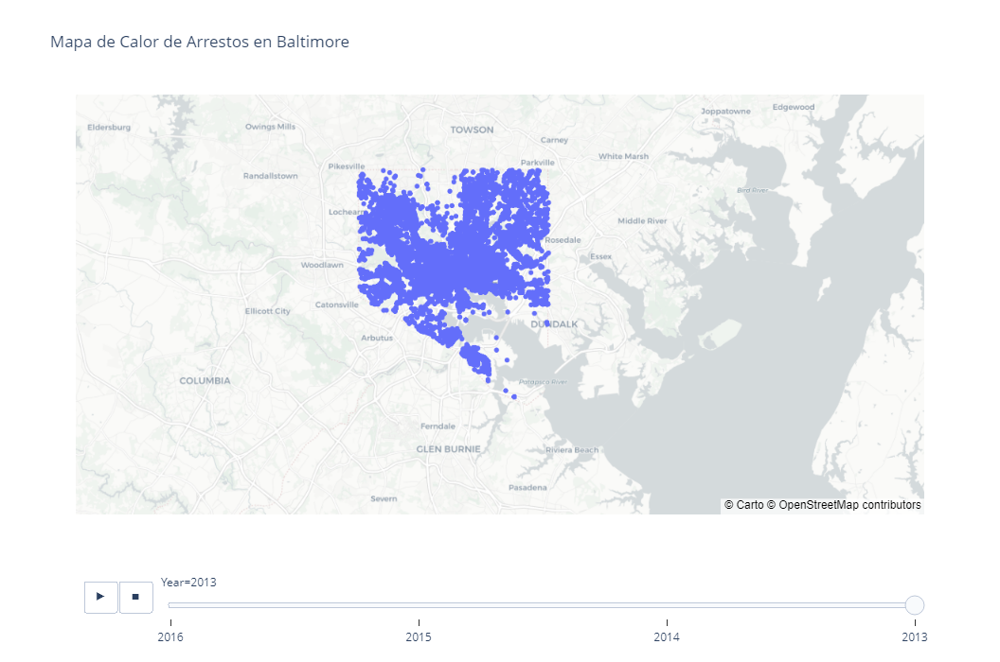

In [31]:

# Filtrar por los 5 delitos más repetidos
top_offenses = df['OffenseCategory'].value_counts().nlargest(5).index
df_top_offenses = df[df['OffenseCategory'].isin(top_offenses)]

# Convertir la fecha de arresto a datetime y extraer el año
df_top_offenses['ArrestDate'] = pd.to_datetime(df_top_offenses['ArrestDate'])
df_top_offenses['Year'] = df_top_offenses['ArrestDate'].dt.year

# Crear el mapa interactivo con Plotly
fig = px.scatter_mapbox(
    df_top_offenses,
    lat='Latitude',
    lon='Longitude',
    height=700,
    width=700,
    size_max=15,
    zoom=10,
    mapbox_style="carto-positron",
    animation_frame='Year',
    title='Mapa de Calor de Arrestos en Baltimore'
)

# Mostrar el mapa
fig.show()


C:\Users\TONAC\AppData\Local\Temp\ipykernel_9880\258605640.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\TONAC\AppData\Local\Temp\ipykernel_9880\258605640.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



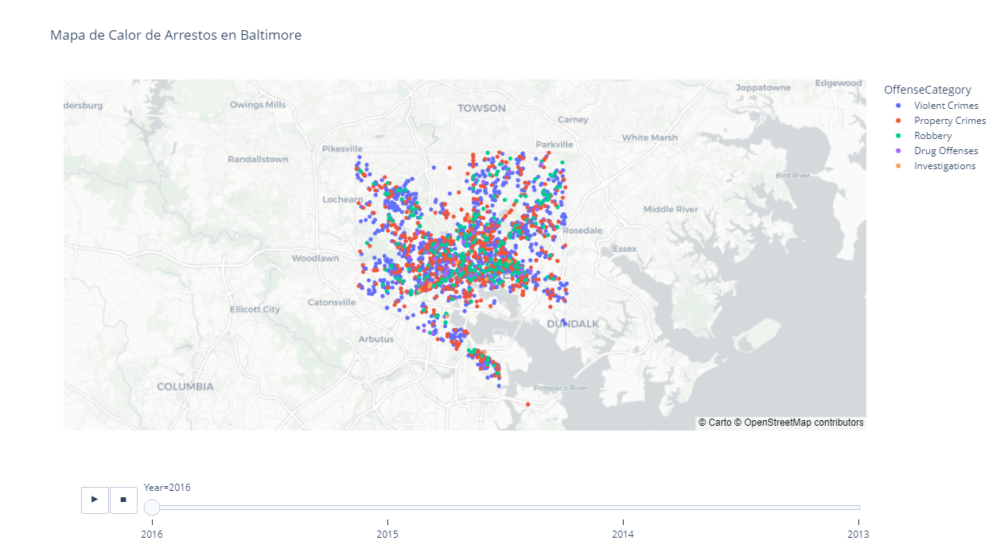

In [53]:
# Asegúrate de que la columna 'IncidentOffense' esté en mayúsculas
df['IncidentOffense'] = df['IncidentOffense'].str.upper()

# Eliminar filas con 'Unknown Offense'
df = df[~df['OffenseCategory'].str.strip().str.lower().eq('other')]

# Crear la columna 'OffenseCategory'
df['OffenseCategory'] = df['IncidentOffense'].map(category_mapping)

# Asegúrate de que no queden valores nulos en la nueva columna
df = df.dropna(subset=['OffenseCategory'])

# Filtrar por los 5 delitos más repetidos
top_offenses = df['OffenseCategory'].value_counts().nlargest(5).index
df_top_offenses = df[df['OffenseCategory'].isin(top_offenses)]

# Convertir la fecha de arresto a datetime y extraer el año
df_top_offenses['ArrestDate'] = pd.to_datetime(df_top_offenses['ArrestDate'])
df_top_offenses['Year'] = df_top_offenses['ArrestDate'].dt.year

# Crear el mapa interactivo con Plotly
fig = px.scatter_mapbox(
    df_top_offenses,
    lat='Latitude',
    lon='Longitude',
    color='OffenseCategory',
    height=700,
    width=700,
    size_max=15,
    zoom=10,
    mapbox_style="carto-positron",
    animation_frame='Year',
    title='Mapa de Calor de Arrestos en Baltimore'
)

# Mostrar el mapa
fig.show()